# 折れ線グラフ

## 概要

## Plotlyによる作図方法

## MADB Labを用いた作図例

In [2]:
import pandas as pd
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

In [3]:
# 前処理の結果，以下に分析対象ファイルが格納されていることを想定
PATH_DATA = '../../data/preprocess/out/episodes.csv'
# Jupyter Book用のPlotlyのrenderer
RENDERER = 'plotly_mimetype+notebook'

In [54]:
# 連載週数の最小値
MIN_WEEKS = 5
# 抽出するマンガ作品数
N_CNAMES = 4

In [55]:
def show_fig(fig):
    """Jupyter Bookでも表示可能なようRendererを指定"""
    fig.update_layout(margin=dict(t=50, l=25, r=25, b=25))
    # 凡例でグラフが潰れないよう調整
    fig.update_layout(legend={
        'yanchor': 'top',
        'xanchor': 'left',
        'x': 0.01, 'y': 0.99})
    fig.show(renderer=RENDERER)

In [56]:
df = pd.read_csv(PATH_DATA)

## 作品別の掲載位置

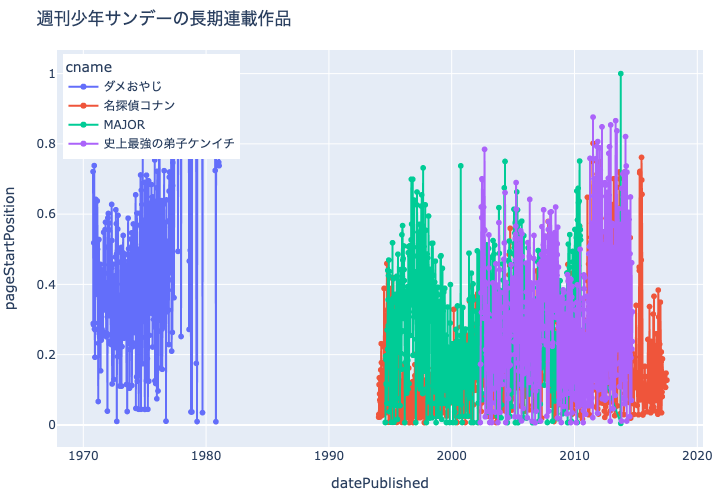

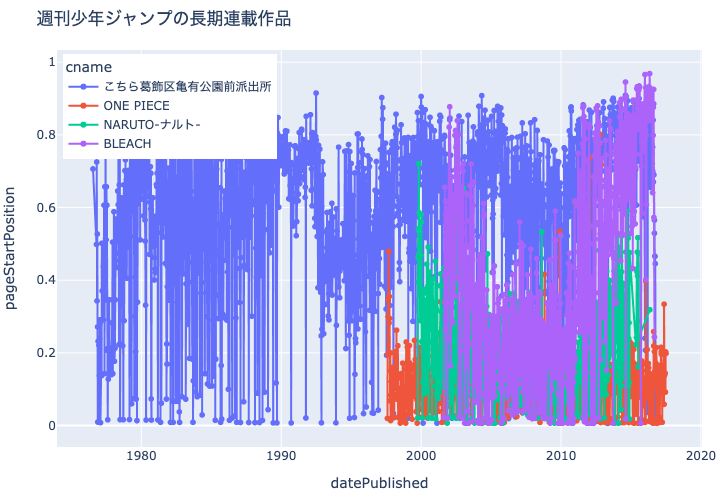

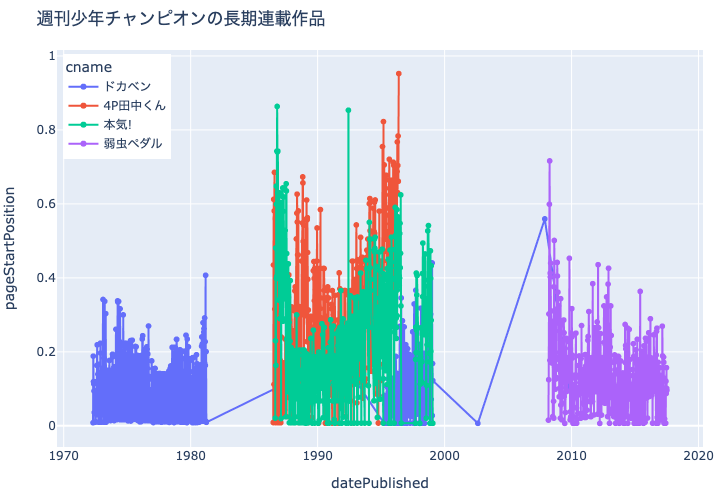

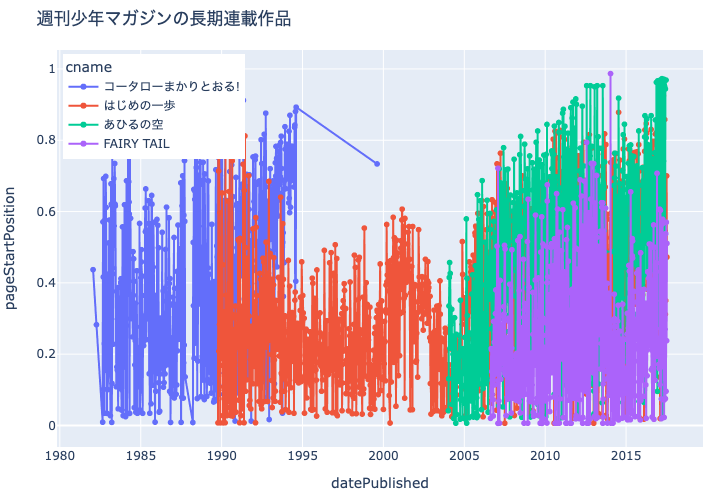

In [58]:
mcnames = sorted(df['mcname'].unique())
for mcname in mcnames:
    df_tmp = df[df['mcname']==mcname].reset_index(drop=True)
    df_cname = \
        df_tmp.value_counts('cname').reset_index(name='weeks')
    df_cname = \
        df_cname.sort_values(
            'weeks', ascending=False, ignore_index=True)
    cnames = df_cname['cname'][:N_CNAMES].values
    df_plot = df_tmp[df_tmp['cname'].isin(cnames)].\
        reset_index(drop=True)
    fig = px.line(
        df_plot, x='datePublished', y='pageStartPosition',
        color='cname', title=f'{mcname}の長期連載作品',
        hover_data=['epname'], height=500)
    fig.update_layout(hovermode='x unified')
    fig.update_traces(mode='markers+lines')
    show_fig(fig)